# Imports

In [42]:
%pip install -r requirements.txt

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [43]:
from time import time
import tracemalloc

import pandas as pd
import numpy as np
from scipy.spatial.distance import euclidean
import matplotlib.pyplot as plt
import matplotlib.image as mimg
import seaborn as sns
import optuna
import folium

from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error

from xgboost import XGBRegressor

from geopy.distance import geodesic

# Carregando os Dados

In [44]:
# Carregar os dados
bts_df = pd.read_csv('Data/Bts.csv')
meds_df = pd.read_csv('Data/meds_train_alunos.csv')

# Análise dos Datasets

In [45]:
print(f"---------------------------BTS.csv---------------------------\n\
Quantidade de dados: {bts_df.shape[0]}\n\
Colunas do dataset: {list(bts_df.columns)}")

---------------------------BTS.csv---------------------------
Quantidade de dados: 9
Colunas do dataset: ['grupo', 'btsId', 'btsNetNome', 'lat', 'lon', 'cch', 'azimuth', 'RssiId']


In [46]:
# Visualizar os dados bts
bts_df

,grupo,btsId,btsNetNome,lat,lon,cch,azimuth,RssiId
0,1,BTS_1_1,PEMDL01_1,-8.04342,-34.952000,873,0,rssi_1_1
1,1,BTS_1_2,PEMDL01_2,-8.04342,-34.952000,872,120,rssi_1_2
2,1,BTS_1_3,PEMDL01_3,-8.04342,-34.952000,875,240,rssi_1_3
3,2,BTS_2_1,PEMDL08_1,-8.05289,-34.944672,865,0,rssi_2_1
4,2,BTS_2_2,PEMDL08_2,-8.05289,-34.944672,874,120,rssi_2_2
5,2,BTS_2_3,PEMDL08_3,-8.05289,-34.944672,871,240,rssi_2_3
6,3,BTS_3_1,PEMDL09_1,-8.05532,-34.957900,877,0,rssi_3_1
7,3,BTS_3_2,PEMDL09_2,-8.05532,-34.957900,881,120,rssi_3_2
8,3,BTS_3_3,PEMDL09_3,-8.05532,-34.957900,869,240,rssi_3_3


In [47]:
print(f"---------------------------Meds_train.csv---------------------------\n\
Quantidade de dados: {meds_df.shape[0]}\n\
Colunas do dataset: {list(meds_df.columns)}")

---------------------------Meds_train.csv---------------------------
Quantidade de dados: 6775
Colunas do dataset: ['ponto_id', 'rssi_1_1', 'rssi_1_2', 'rssi_1_3', 'rssi_2_1', 'rssi_2_2', 'rssi_2_3', 'rssi_3_1', 'rssi_3_2', 'rssi_3_3', 'delay_1', 'delay_2', 'delay_3', 'lat', 'lon', 'indoor']


In [48]:
meds_df.head(10)

,ponto_id,rssi_1_1,rssi_1_2,rssi_1_3,rssi_2_1,rssi_2_2,rssi_2_3,rssi_3_1,rssi_3_2,rssi_3_3,delay_1,delay_2,delay_3,lat,lon,indoor
0,6604,-103.705000,-110.425000,-107.381667,-110.330000,-108.345000,-106.590000,-107.153333,-102.120000,-115.0000,5.0,3.0,2.0,-8.055786,-34.951505,True
1,5515,-105.225000,-115.000000,-105.210000,-115.000000,-105.835000,-115.000000,-88.470000,-94.024286,-108.1200,5.0,3.0,2.0,-8.055784,-34.951608,True
2,5049,-102.610000,-115.000000,-101.380000,-115.000000,-104.295000,-97.360000,-96.980000,-99.572500,-115.0000,5.0,3.0,2.0,-8.055506,-34.951693,True
3,8737,-89.140000,-97.251429,-86.642857,-96.036667,-96.592500,-92.460000,-86.813333,-102.688000,-87.2700,4.0,7.0,2.0,-8.050390,-34.959630,False
4,1203,-109.088333,-107.200000,-107.010000,-108.430000,-104.845714,-101.435714,-103.065000,-102.110000,-115.0000,5.0,3.0,2.0,-8.055380,-34.951736,True
5,6952,-91.530000,-99.115714,-89.424286,-96.235000,-92.837500,-93.327143,-82.363333,-81.940000,-79.3400,6.0,5.0,0.0,-8.055780,-34.956390,False
6,8875,-80.246429,-98.010714,-81.366667,-99.550000,-97.245000,-93.067143,-71.000000,-99.934667,-95.8475,3.0,4.0,3.0,-8.049710,-34.954640,False
7,1926,-98.748000,-99.670000,-98.610000,-97.860000,-92.837500,-90.747143,-100.030000,-95.250000,-115.0000,5.0,3.0,3.0,-8.055494,-34.951316,True
8,2641,-115.000000,-115.000000,-115.000000,-115.000000,-96.330000,-92.668333,-88.890000,-78.261429,-115.0000,5.0,3.0,3.0,-8.055684,-34.951331,True
9,3399,-100.830000,-115.000000,-98.560000,-115.000000,-100.406667,-97.845714,-99.255000,-104.940000,-115.0000,5.0,3.0,3.0,-8.055834,-34.951362,True


In [49]:
# Análise preliminar dos dados
meds_df.describe()

,ponto_id,rssi_1_1,rssi_1_2,rssi_1_3,rssi_2_1,rssi_2_2,rssi_2_3,rssi_3_1,rssi_3_2,rssi_3_3,delay_1,delay_2,delay_3,lat,lon
count,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000,6775.000000
mean,4856.099779,-100.789923,-105.688802,-100.545198,-103.524786,-97.210290,-97.193499,-93.644749,-93.353728,-107.478361,4.679410,3.159262,2.504945,-8.054510,-34.951792
std,2785.645694,10.025728,10.397924,9.968138,13.367328,8.853480,9.992950,7.688089,8.110877,11.003407,0.911469,1.009927,1.095094,0.002388,0.002310
min,1.000000,-115.000000,-115.000000,-115.000000,-115.000000,-115.000000,-115.000000,-113.140000,-115.630000,-115.000000,1.000000,0.000000,0.000000,-8.059550,-34.959850
25%,2434.500000,-107.650000,-115.000000,-107.148571,-115.000000,-102.202857,-101.652857,-99.480000,-99.005000,-115.000000,5.000000,3.000000,2.000000,-8.055784,-34.951728
50%,4875.000000,-103.040000,-110.425000,-99.750000,-108.430000,-97.170000,-95.615714,-94.785000,-95.688000,-115.000000,5.000000,3.000000,2.000000,-8.055494,-34.951597
75%,7272.500000,-93.455000,-97.350000,-93.340000,-96.817917,-92.080000,-91.951429,-89.375000,-89.610500,-97.600000,5.000000,3.000000,3.000000,-8.055310,-34.951331
max,9676.000000,-61.380000,-64.820000,-60.640000,-36.960000,-59.170000,-56.980000,-56.060000,-55.870000,-52.540000,8.000000,7.000000,7.000000,-8.046420,-34.945110


## Verificando se há Missing Values:

In [50]:
bts_df.isnull().sum()

grupo         0
btsId         0
btsNetNome    0
lat           0
lon           0
cch           0
azimuth       0
RssiId        0
dtype: int64

In [51]:
meds_df.isnull().sum()

ponto_id    0
rssi_1_1    0
rssi_1_2    0
rssi_1_3    0
rssi_2_1    0
rssi_2_2    0
rssi_2_3    0
rssi_3_1    0
rssi_3_2    0
rssi_3_3    0
delay_1     0
delay_2     0
delay_3     0
lat         0
lon         0
indoor      0
dtype: int64

## Verificando se há dados duplicados:

In [52]:
print(f"Quantidade de duplicatas = {meds_df.drop_duplicates(subset=['ponto_id']).shape[0] - meds_df.shape[0]}")

Quantidade de duplicatas = 0


## Separando os Dados

In [53]:
meds_df = meds_df.sample(frac=1, replace=False).reset_index(drop=True)
n_lines = meds_df.shape[0]
n_lines

6775

In [54]:
train_size = 0.8 * n_lines
val_size = 0.1 * n_lines
test_size = 0.1 * n_lines

In [55]:
meds_train = meds_df.iloc[:int(train_size)]
meds_val = meds_df.iloc[int(train_size) : int(n_lines - test_size)]
meds_test = meds_df.iloc[int(n_lines - test_size):]

In [56]:
meds_train_indoor = meds_train[meds_train["indoor"] == True]
meds_train_outdoor = meds_train[meds_train["indoor"] == False]

print("-- Treinamento --")
print(f"Quantidade de dados Indoor:  {meds_train_indoor.shape[0]}")
print(f"Quantidade de dados Outdoor: {meds_train_outdoor.shape[0]}")

meds_val_indoor = meds_val[meds_val["indoor"] == True]
meds_val_outdoor = meds_val[meds_val["indoor"] == False]

print("\n-- Validação --")
print(f"Quantidade de dados Indoor:  {meds_val_indoor.shape[0]}")
print(f"Quantidade de dados Outdoor: {meds_val_outdoor.shape[0]}")

-- Treinamento --
Quantidade de dados Indoor:  3687
Quantidade de dados Outdoor: 1733

-- Validação --
Quantidade de dados Indoor:  484
Quantidade de dados Outdoor: 193


## Balanceando a Distribuição

In [57]:
def random_oversampling(n_samples, df):
    num_new_samples = n_samples - df.shape[0]

    df_samples = df.sample(n=num_new_samples, replace=True)
    df = pd.concat([df, df_samples], ignore_index=False)
    df = df.sample(frac=1, replace=False).reset_index(drop=True)
    
    return df

In [58]:
def balance_distribution(df):
    lat_min, lat_max = df['lat'].min(), df['lat'].max()
    lon_min, lon_max = df['lon'].min(), df['lon'].max()

    lat_bins = np.linspace(lat_min, lat_max, 11)
    lon_bins = np.linspace(lon_min, lon_max, 11)

    df_copy = df.copy()

    df_copy.loc[:, 'lat_bin'] = pd.cut(df_copy['lat'], bins=lat_bins, labels=False, include_lowest=True)
    df_copy.loc[:, 'lon_bin'] = pd.cut(df_copy['lon'], bins=lon_bins, labels=False, include_lowest=True)

    grid_counts = df_copy.groupby(['lat_bin', 'lon_bin']).size().unstack(fill_value=0)

    max_count = grid_counts.max().max()
    oversampled_df = pd.DataFrame()

    for (i, j), count in np.ndenumerate(grid_counts.values):
        if count > 0:
            bin_df = df_copy[(df_copy['lat_bin'] == i) & (df_copy['lon_bin'] == j)]
            oversampled_bin_df = random_oversampling(max_count, bin_df)
            oversampled_df = pd.concat([oversampled_df, oversampled_bin_df])

    oversampled_df.reset_index(drop=True, inplace=True)

    oversampled_df.loc[:, 'lat_bin'] = pd.cut(oversampled_df['lat'], bins=lat_bins, labels=False, include_lowest=True)
    oversampled_df.loc[:, 'lon_bin'] = pd.cut(oversampled_df['lon'], bins=lon_bins, labels=False, include_lowest=True)
    
    grid_counts = oversampled_df.groupby(['lat_bin', 'lon_bin']).size().unstack(fill_value=0)

    oversampled_df.drop(['lat_bin', 'lon_bin'], axis=1, inplace=True)
    oversampled_df = oversampled_df.sample(frac=1, replace=False).reset_index(drop=True)

    return oversampled_df

In [59]:
meds_train_outdoor = balance_distribution(meds_train_outdoor)
meds_val_outdoor = balance_distribution(meds_val_outdoor)

In [60]:
meds_train = pd.concat([meds_train_indoor, meds_train_outdoor], ignore_index=False)
meds_train = meds_train.sample(frac=1, replace=False).reset_index(drop=True)

meds_val = pd.concat([meds_val_indoor, meds_val_outdoor], ignore_index=False)
meds_val = meds_val.sample(frac=1, replace=False).reset_index(drop=True)

## Normalizando os Dados

In [61]:
columns_to_normalize = [
    'rssi_1_1', 'rssi_1_2', 'rssi_1_3',
    'rssi_2_1', 'rssi_2_2', 'rssi_2_3',
    'rssi_3_1', 'rssi_3_2', 'rssi_3_3',
    'delay_1', 'delay_2', 'delay_3'
]

In [62]:
scaler = MinMaxScaler()
scaler.fit(meds_train[columns_to_normalize])

MinMaxScaler()

In [63]:
meds_train[columns_to_normalize] = scaler.transform(meds_train[columns_to_normalize])
meds_val[columns_to_normalize] = scaler.transform(meds_val[columns_to_normalize])
meds_test[columns_to_normalize] = scaler.transform(meds_test[columns_to_normalize])

df_train = pd.DataFrame(meds_train)
df_val = pd.DataFrame(meds_val)
df_test = pd.DataFrame(meds_test)

meds_train.head()

C:\Users\Amand\AppData\Local\Temp\ipykernel_34180\1967096315.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,ponto_id,rssi_1_1,rssi_1_2,rssi_1_3,rssi_2_1,rssi_2_2,rssi_2_3,rssi_3_1,rssi_3_2,rssi_3_3,delay_1,delay_2,delay_3,lat,lon,indoor
0,49,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.389103,0.531837,0.000000,0.666667,0.428571,0.285714,-8.055605,-34.951728,True
1,6679,0.432648,0.437539,0.425444,0.244597,0.499179,0.531245,0.366328,0.608167,0.306476,1.000000,0.428571,0.571429,-8.058630,-34.949250,False
2,8922,0.639367,0.440955,0.653369,0.466812,0.346588,0.434850,0.372168,0.328113,0.299672,0.166667,0.571429,0.428571,-8.049530,-34.953290,False
3,7704,0.528134,0.510163,0.458294,0.416197,0.665010,0.643128,0.390972,0.662335,0.292667,0.500000,0.285714,0.571429,-8.053560,-34.949040,False
4,7550,0.462514,0.468499,0.466204,0.341620,0.544689,0.456222,0.422594,0.452481,0.298231,0.666667,0.285714,0.428571,-8.054310,-34.949470,False


## Análise com Gráficos

### Locais Analisados

In [64]:
lat, lon = meds_df['lat'], meds_df['lon']
mapa = folium.Map(location=[np.mean(lat), np.mean(lon)], zoom_start=12)

# Adicionar marcadores para os pontos reais (magenta)
for lat, lon in zip(lat, lon):
    folium.CircleMarker(location=[lat, lon], radius=5, color='magenta', fill=True, fill_color='magenta', fill_opacity=0.6).add_to(mapa)

lat, lon = meds_df[(meds_df['indoor'] == False)]['lat'], meds_df[(meds_df['indoor'] == False)]['lon']

# Adicionar marcadores para os pontos reais (azul)
for lat, lon in zip(lat, lon):
    folium.CircleMarker(location=[lat, lon], radius=5, color='blue', fill=True, fill_color='blue', fill_opacity=0.6).add_to(mapa)

# Exibir o mapa
mapa

### Locais Indoor

In [65]:
lat, lon = meds_df[(meds_df['indoor'] == True)]['lat'], meds_df[(meds_df['indoor'] == True)]['lon']
mapa = folium.Map(location=[np.mean(lat), np.mean(lon)], zoom_start=12)

# Adicionar marcadores para os pontos reais (magenta)
for lat, lon in zip(lat, lon):
    folium.CircleMarker(location=[lat, lon], radius=5, color='magenta', fill=True, fill_color='magenta', fill_opacity=0.6).add_to(mapa)

# Exibir o mapa
mapa

### Locais Outdoor

In [66]:
lat, lon = meds_df[(meds_df['indoor'] == False)]['lat'], meds_df[(meds_df['indoor'] == False)]['lon']
mapa = folium.Map(location=[np.mean(lat), np.mean(lon)], zoom_start=12)

# Adicionar marcadores para os pontos reais (azul)
for lat, lon in zip(lat, lon):
    folium.CircleMarker(location=[lat, lon], radius=5, color='blue', fill=True, fill_color='blue', fill_opacity=0.6).add_to(mapa)

# Exibir o mapa
mapa

### Localização das BTS

In [67]:
lat, lon = bts_df['lat'], bts_df['lon']
mapa = folium.Map(location=[np.mean(lat), np.mean(lon)], zoom_start=12)

# Adicionar marcadores para os pontos reais (azul)
for lat, lon in zip(lat, lon):
    folium.CircleMarker(location=[lat, lon], radius=5, color='magenta', fill=True, fill_color='magenta', fill_opacity=0.6).add_to(mapa)

# Exibir o mapa
mapa

# Implementando Modelos Para Achar Localização

Nesse método, iremos considerar os dados de treinamento como o nosso *fingerprint* de referência e cada dado no conjunto de teste como um *fingerprint* alvo. Como no *fingerprint* de referência temos o nível de sinal em cada BTS, como um número do tipo float, e a localização dos pontos com esses níveis, nós iremos calcular a distância euclidiana, usando o método euclidean da biblioteca scipy, entre os níveis de sinais do *fingerprint* alvo e os níveis em cada dado no *fingerprint* de referência, e iremos estabelecer a localização do *fingerprint* alvo como sendo a localização no *fingerprint* de referência que possuem a menor distância euclidiana.

Como vimos mais cedo que há vários dados com a mesma longitude e latitude no dataset, para diminuir o tempo de predição desse método, iremos remover esses dados duplicados e iremos assumir que o valor dos RSSI's para os dados que permanecerem será igual a média dos valores de RSSI's de todos os dados que tiverem essa coordenada.

In [68]:
# Função para encontrar a localização com base no fingerprint
def find_location(fingerprint, fp_ref:pd.DataFrame):
    fp_ref = fp_ref.copy()
    fp_ref['distance'] = [euclidean(fingerprint, row.values) for j, row in fp_ref.drop(['lat', 'lon'], axis=1).iterrows()]
    point = fp_ref[(fp_ref['distance'] == fp_ref['distance'].min())].iloc[0]
    return (point['lat'], point['lon'])

## Fingerprint com Dados Normalizados e sem Localizações Duplicadas

In [69]:
dup =df_train[(df_train.duplicated(subset=['lat','lon'], keep=False))]
no_dup =  df_train.drop_duplicates(subset=['lat', 'lon'])

med = dup.groupby(['lat', 'lon']).mean()
med.reset_index(inplace=True)

fp_map = pd.concat([no_dup, med], ignore_index=True)

In [70]:
fp_map.shape, df_train.shape

((2793, 16), (9673, 16))

Com isso, reduzimos o tamanho do nosso mapa de 9673 pontos para 2793 pontos, reduzindo também o tempo para calcular a posição de um novo ponto.

In [71]:
erro_dup = []
loc_pred = pd.DataFrame({'ponto_id': df_test['ponto_id'].to_list()})
loc_pred['lat'] = pd.Series()
loc_pred['lon'] = pd.Series()
inicio = time()
for i, df in df_test.iterrows():
   id = df['ponto_id']
   fingerprint = df.drop(['ponto_id', 'lat', 'lon', 'indoor']).values
   fp_ref = fp_map.drop(['ponto_id', 'indoor'], axis=1)

   lat, lon = find_location(fingerprint, fp_ref)
   loc_pred.loc[loc_pred['ponto_id'] == id, 'lat'] = lat
   loc_pred.loc[loc_pred['ponto_id'] == id, 'lon'] = lon

   erro_dup.append(geodesic((lat, lon), (df['lat'], df['lon'])).meters)

fim = time()
print(f'Tempo para prever localização de {df_test.shape[0]} pontos: {fim - inicio:.2f} segundos')

Tempo para prever localização de 678 pontos: 35.00 segundos


In [72]:
acc = sum(erro_dup)/len(erro_dup)
print(f'Acurácia (Erro médio): {acc:0.2f} metros')
print(f'Erro máximo: {max(erro_dup):.2f} metros')
print(f'Erro mínimo: {min(erro_dup):0.2f} metros')
print(f'Desvio padrão: {pd.Series(erro_dup).std():0.2f}')

Acurácia (Erro médio): 10.52 metros
Erro máximo: 308.06 metros
Erro mínimo: 0.00 metros
Desvio padrão: 27.17


## Fingerprint com Dados Normalizados e com Localizações Duplicadas

In [73]:
erro = []
loc_pred = pd.DataFrame({'ponto_id': df_test['ponto_id'].to_list()})
loc_pred['lat'] = pd.Series()
loc_pred['lon'] = pd.Series()
inicio = time()
for i, df in df_test.iterrows():
   id = df['ponto_id']
   fingerprint = df.drop(['ponto_id', 'lat', 'lon', 'indoor']).values
   fp_ref = df_train.drop(['ponto_id', 'indoor'], axis=1)

   lat, lon = find_location(fingerprint, fp_ref)
   loc_pred.loc[loc_pred['ponto_id'] == id, 'lat'] = lat
   loc_pred.loc[loc_pred['ponto_id'] == id, 'lon'] = lon

   erro.append(geodesic((lat, lon), (df['lat'], df['lon'])).meters)

fim = time()
print(f'Tempo para prever localização de {df_test.shape[0]} pontos: {fim - inicio:.2f} segundos')

Tempo para prever localização de 678 pontos: 129.23 segundos


In [74]:
acc = sum(erro)/len(erro)
print(f'Acurácia (Erro médio): {acc:0.2f} metros')
print(f'Erro máximo: {max(erro):.2f} metros')
print(f'Erro mínimo: {min(erro):0.2f} metros')
print(f'Desvio padrão: {pd.Series(erro).std():0.2f}')

Acurácia (Erro médio): 9.40 metros
Erro máximo: 308.06 metros
Erro mínimo: 0.00 metros
Desvio padrão: 26.74


## KNN e MLP

## Treinando os Modelos

In [75]:
X_train = meds_train.drop(["ponto_id", "indoor", "lat", "lon"], axis=1).values
Y_train = meds_train[["lat", "lon"]].values

X_val = meds_val.drop(["ponto_id", "indoor", "lat", "lon"], axis=1).values
Y_val = meds_val[["lat", "lon"]].values

X_test = meds_test.drop(["ponto_id", "indoor", "lat", "lon"], axis=1).values
Y_test = meds_test[["lat", "lon"]].values

In [76]:
def objective_knn(trial):
    # Sugerir os hiperparâmetros para o modelo KNN
    n_neighbors = trial.suggest_int('n_neighbors', 1, 20)
    p = trial.suggest_categorical('p', [1, 2])
    weights = trial.suggest_categorical('weights', ['uniform', 'distance'])
    metric = trial.suggest_categorical('metric', ['euclidean', 'manhattan', 'minkowski'])

    # Criar e treinar o modelo
    tracemalloc.start()
    snapshot1 = tracemalloc.take_snapshot()

    knn_lat = KNeighborsRegressor(n_neighbors=n_neighbors, p=p, weights=weights, metric=metric)

    time1 = time()
    knn_lat.fit(X_train, Y_train)
    time2 = time()

    snapshot2 = tracemalloc.take_snapshot()
    tracemalloc.stop()

    training_time = time2 - time1
    trial.set_user_attr('training_time', training_time)

    stats = snapshot2.compare_to(snapshot1, 'lineno')
    memory_usage = sum(stat.size_diff for stat in stats) / 1024
    trial.set_user_attr('memory_usage', memory_usage)

    Y_pred = knn_lat.predict(X_val)
    loss = np.mean(mean_squared_error(Y_val, Y_pred))

    return loss

In [77]:
def objective_mlp(trial):
    # Sugerir hiperparâmetros para o MLPRegressor
    hidden_layer_sizes = tuple([trial.suggest_int(f'n_units_l{i}', 50, 100, step=10) for i in range(1, trial.suggest_int("n_layers", 1, 2) + 1)])
    activation = trial.suggest_categorical('activation', ['relu', 'tanh'])
    solver = trial.suggest_categorical('solver', ['adam', 'sgd'])
    alpha = trial.suggest_float('alpha', 1e-5, 1e-2, log=True)
    learning_rate = trial.suggest_categorical('learning_rate', ['constant', 'invscaling', 'adaptive'])

    # Criar e treinar o modelo para latitude
    tracemalloc.start()
    snapshot1 = tracemalloc.take_snapshot()

    mlp_lat = MLPRegressor(hidden_layer_sizes=hidden_layer_sizes, activation=activation, solver=solver,
                           alpha=alpha, learning_rate=learning_rate, max_iter=200, random_state=70)

    time1 = time()
    mlp_lat.fit(X_train, Y_train)
    time2 = time()

    snapshot2 = tracemalloc.take_snapshot()
    tracemalloc.stop()

    training_time = time2 - time1
    trial.set_user_attr('training_time', training_time)

    stats = snapshot2.compare_to(snapshot1, 'lineno')
    memory_usage = sum(stat.size_diff for stat in stats) / 1024
    trial.set_user_attr('memory_usage', memory_usage)

    Y_pred = mlp_lat.predict(X_val)
    loss = np.mean(mean_squared_error(Y_val, Y_pred))

    return loss

In [78]:
def objective_xgb(trial):
    # Sugerir hiperparâmetros para o XGBRegressor
    n_estimators = trial.suggest_int('n_estimators', 50, 300)
    max_depth = trial.suggest_int('max_depth', 3, 15)
    learning_rate = trial.suggest_float('learning_rate', 0.01, 0.3, log=True)
    subsample = trial.suggest_float('subsample', 0.5, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.5, 1.0)
    alpha = trial.suggest_float('alpha', 1e-5, 1e-2, log=True)
    lambda_ = trial.suggest_float('lambda', 1e-5, 1e-2, log=True)

    # Criar e treinar o modelo para latitude
    tracemalloc.start()
    snapshot1 = tracemalloc.take_snapshot()

    xgb_lat = XGBRegressor(n_estimators=n_estimators, max_depth=max_depth, learning_rate=learning_rate,
                           subsample=subsample, colsample_bytree=colsample_bytree, reg_alpha=alpha,
                           reg_lambda=lambda_, random_state=70)

    time1 = time()
    xgb_lat.fit(X_train, Y_train)
    time2 = time()

    snapshot2 = tracemalloc.take_snapshot()
    tracemalloc.stop()

    training_time = time2 - time1
    trial.set_user_attr('training_time', training_time)

    stats = snapshot2.compare_to(snapshot1, 'lineno')
    memory_usage = sum(stat.size_diff for stat in stats) / 1024
    trial.set_user_attr('memory_usage', memory_usage)

    Y_pred = xgb_lat.predict(X_val)
    loss = np.mean(mean_squared_error(Y_val, Y_pred))

    return loss

In [79]:
optuna.logging.set_verbosity(optuna.logging.WARNING)

In [80]:
study_knn = optuna.create_study(direction='minimize')

# Executar o estudo
study_knn.optimize(objective_knn, n_trials=15, show_progress_bar=True)

Best trial: 5. Best value: 1.99881e-08: 100%|██████████| 15/15 [00:00<00:00, 40.29it/s]


In [81]:
optuna.visualization.plot_optimization_history(study_knn)

In [82]:
optuna.visualization.plot_param_importances(study_knn)

In [83]:
best_trial_knn = study_knn.best_trial

print("Best parameters:", best_trial_knn.params)
print("Best value:", best_trial_knn.value)
print(f"Training time: {best_trial_knn.user_attrs["training_time"]} seconds")
print(f"Memory usage: {best_trial_knn.user_attrs["memory_usage"]} KiB")

Best parameters: {'n_neighbors': 10, 'p': 2, 'weights': 'distance', 'metric': 'manhattan'}
Best value: 1.9988102906163033e-08
Training time: 0.010916709899902344 seconds
Memory usage: 1098.828125 KiB


In [84]:
# Resultados da MLP
study_mlp = optuna.create_study(direction='minimize')
study_mlp.optimize(objective_mlp, n_trials=5, show_progress_bar=True)

Best trial: 1. Best value: 0.000560995:  40%|████      | 2/5 [00:14<00:20,  6.94s/it]c:\Users\Amand\OneDrive\Documentos\VSCode\Projeto-Comunicacoes\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.

Best trial: 4. Best value: 0.000372591: 100%|██████████| 5/5 [00:33<00:00,  6.66s/it]


In [85]:
optuna.visualization.plot_optimization_history(study_mlp)

In [86]:
optuna.visualization.plot_param_importances(study_mlp)

In [87]:
best_trial_mlp = study_mlp.best_trial

print("Best parameters:", best_trial_mlp.params)
print("Best value:", best_trial_mlp.value)
print(f"Training time: {best_trial_mlp.user_attrs["training_time"]} seconds")
print(f"Memory usage: {best_trial_mlp.user_attrs["memory_usage"]} KiB")

Best parameters: {'n_layers': 2, 'n_units_l1': 90, 'n_units_l2': 70, 'activation': 'tanh', 'solver': 'sgd', 'alpha': 7.401683951639797e-05, 'learning_rate': 'adaptive'}
Best value: 0.0003725906044856473
Training time: 7.081833600997925 seconds
Memory usage: 130.4453125 KiB


In [88]:
# Resultados do XGBoost
study_xgb = optuna.create_study(direction='minimize')
study_xgb.optimize(objective_xgb, n_trials=15, show_progress_bar=True)

Best trial: 8. Best value: 6.25948e-08: 100%|██████████| 15/15 [00:02<00:00,  5.69it/s]


In [89]:
optuna.visualization.plot_optimization_history(study_xgb)

In [90]:
optuna.visualization.plot_param_importances(study_xgb)

In [91]:
best_trial_xgb = study_xgb.best_trial

print("Best parameters:", best_trial_xgb.params)
print("Best value:", best_trial_xgb.value)
print(f"Training time: {best_trial_xgb.user_attrs["training_time"]} seconds")
print(f"Memory usage: {best_trial_xgb.user_attrs["memory_usage"]} KiB")

Best parameters: {'n_estimators': 295, 'max_depth': 15, 'learning_rate': 0.2706468997950129, 'subsample': 0.9162822962032462, 'colsample_bytree': 0.8690094547623934, 'alpha': 0.0048895996043804716, 'lambda': 2.621733938893639e-05}
Best value: 6.259477148218312e-08
Training time: 0.18226861953735352 seconds
Memory usage: 8.9697265625 KiB


## Criando Modelos com Melhores Parâmetros

In [92]:
best_params_knn = best_trial_knn.params

knn_final = KNeighborsRegressor(
    n_neighbors=best_params_knn['n_neighbors'],
    p=best_params_knn['p'],
    weights=best_params_knn['weights'],
    metric=best_params_knn['metric']
)
knn_final.fit(X_train, Y_train)

KNeighborsRegressor(metric='manhattan', n_neighbors=10, weights='distance')

In [93]:
# Treinar o modelo final com os melhores parâmetros
best_params_mlp = best_trial_mlp.params
mlp_final = MLPRegressor(
    hidden_layer_sizes=tuple([best_params_mlp[f'n_units_l{i + 1}'] for i in range(best_params_mlp['n_layers'])]),
    activation=best_params_mlp['activation'],
    solver=best_params_mlp['solver'], alpha=best_params_mlp['alpha'],
    learning_rate=best_params_mlp['learning_rate'], max_iter=200, random_state=42
)
mlp_final.fit(X_train, Y_train)

MLPRegressor(activation='tanh', alpha=7.401683951639797e-05,
             hidden_layer_sizes=(90, 70), learning_rate='adaptive',
             random_state=42, solver='sgd')

In [94]:
# Treinar o modelo final com os melhores parâmetros
best_params_xgb = best_trial_xgb.params

xgb_final = XGBRegressor(
    n_estimators=best_params_xgb['n_estimators'], 
    max_depth=best_params_xgb['max_depth'], 
    learning_rate=best_params_xgb['learning_rate'],
    subsample=best_params_xgb['subsample'], 
    colsample_bytree=best_params_xgb['colsample_bytree'], 
    reg_alpha=best_params_xgb['alpha'], 
    reg_lambda=best_params_xgb['lambda'], 
    random_state=42
)
xgb_final.fit(X_train, Y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8690094547623934, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.2706468997950129, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=15, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=295, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [95]:
# Prever e calcular as métricas
Y_pred_final_xgb = xgb_final.predict(X_test)
mse_final = np.mean(mean_squared_error(Y_test, Y_pred_final_xgb))
rmse_final = np.sqrt(mse_final)
mae_final = mean_absolute_error(Y_test, Y_pred_final_xgb)

print("\n XGB: \n")
print(f"Final Model - MSE Latitude: {mse_final}")
print(f"Final Model - RMSE Latitude: {rmse_final}")
print(f"Final Model - MAE Latitude: {mae_final}")


 XGB: 

Final Model - MSE Latitude: 4.533515466906397e-08
Final Model - RMSE Latitude: 0.00021292053604352957
Final Model - MAE Latitude: 0.0001211968113721485


In [96]:
# Prever e calcular as métricas
Y_pred_final_mlp = mlp_final.predict(X_test)
mse_final = np.mean(mean_squared_error(Y_test, Y_pred_final_mlp))
rmse_final = np.sqrt(mse_final)
mae_final = mean_absolute_error(Y_test, Y_pred_final_mlp)

print("\n MLP: \n")
print(f"Final Model - MSE Latitude: {mse_final}")
print(f"Final Model - RMSE Latitude: {rmse_final}")
print(f"Final Model - MAE Latitude: {mae_final}")


 MLP: 

Final Model - MSE Latitude: 0.00023458317095597254
Final Model - RMSE Latitude: 0.0153161082183423
Final Model - MAE Latitude: 0.01185039186957891


In [97]:
# Prever e calcular as métricas
Y_pred_final_knn = knn_final.predict(X_test)
mse_final = np.mean(mean_squared_error(Y_test, Y_pred_final_knn))
rmse_final = np.sqrt(mse_final)
mae_final = mean_absolute_error(Y_test, Y_pred_final_knn)

print("\n KNN: \n")
print(f"Final Model - MSE Latitude: {mse_final}")
print(f"Final Model - RMSE Latitude: {rmse_final}")
print(f"Final Model - MAE Latitude: {mae_final}")


 KNN: 

Final Model - MSE Latitude: 1.7668958055307116e-08
Final Model - RMSE Latitude: 0.00013292463298917592
Final Model - MAE Latitude: 4.367254716127942e-05


## Funções úteis

In [98]:
def calculate_distance(lat1, lon1, lat2, lon2):
    return geodesic((lat1, lon1), (lat2, lon2)).meters

In [99]:
def test_prediction(index, X_test, y_test_lat, y_test_lon, model_lat, model_lon):
    test_point = X_test.iloc[index]
    true_lat = y_test_lat.iloc[index]
    true_lon = y_test_lon.iloc[index]

    # Faz a predição
    pred_lat = model_lat.predict([test_point])[0]
    pred_lon = model_lon.predict([test_point])[0]

    # Mostra o resultado
    print(f"Ponto de Teste Selecionado (índice {index}):")
    print(f"Latitude Real: {true_lat}")
    print(f"Longitude Real: {true_lon}")
    print(f"Latitude Predita: {pred_lat}")
    print(f"Longitude Predita: {pred_lon}")

    # Calcular o erro em metros
    real_position = (true_lat, true_lon)
    predicted_position = (pred_lat, pred_lon)
    error = geodesic(real_position, predicted_position).meters

    return error

In [100]:
def calculate_errors(X_test_df, y_test_lat, y_test_lon, model_lat, model_lon):
    pred_lat = model_lat
    pred_lon = model_lon

    # Calcular os erros
    errors = []
    for i in range(len(X_test_df)):
        true_lat = y_test_lat[i]
        true_lon = y_test_lon[i]
        predicted_lat = pred_lat[i]
        predicted_lon = pred_lon[i]

        real_position = (true_lat, true_lon)
        predicted_position = (predicted_lat, predicted_lon)
        error = geodesic(real_position, predicted_position).meters
        errors.append((i, error))

    # Converter para DataFrame e ordenar por erro
    errors_df = pd.DataFrame(errors, columns=['Index', 'Error'])
    errors_df_sorted = errors_df.sort_values(by='Error', ascending=False).reset_index(drop=True)

    return errors_df_sorted

In [101]:
def calculate_accuracy(errors, threshold):
    correct_predictions = (errors['Error'] <= threshold).sum()
    total_predictions = len(errors)

    # Calcular a porcentagem de acurácia
    accuracy_percentage = (correct_predictions / total_predictions) * 100
    incorrect_percentage = 100 - accuracy_percentage

    return accuracy_percentage, incorrect_percentage

In [102]:
def accuracy_meters(erros):
    erros = erros['Error'].to_list()
    return sum(erros)/len(erros)

## Histograma dos erros

In [103]:
Y_test

array([[ -8.04914 , -34.9457  ],
       [ -8.04914 , -34.94749 ],
       [ -8.055605, -34.951728],
       ...,
       [ -8.05174 , -34.94641 ],
       [ -8.055494, -34.951316],
       [ -8.05538 , -34.951736]])

In [104]:
errors_lat_xgb, errors_lon_xgb  = [], []
errors_lat_mlp, errors_lon_mlp  = [], []
errors_lat_knn, errors_lon_knn  = [], []

for true_lat, true_lon, pred_lat, pred_lon in zip(Y_test[:, 0], Y_test[:, 1], Y_pred_final_xgb[:, 0], Y_pred_final_xgb[:, 1]):
    dist = calculate_distance(true_lat, true_lon, pred_lat, pred_lon)
    errors_lat_xgb.append(dist)
    errors_lon_xgb.append(dist)

for true_lat, true_lon, pred_lat, pred_lon in zip(Y_test[:, 0], Y_test[:, 1], Y_pred_final_mlp[:, 0], Y_pred_final_mlp[:, 1]):
    dist = calculate_distance(true_lat, true_lon, pred_lat, pred_lon)
    errors_lat_mlp.append(dist)
    errors_lon_mlp.append(dist)

for true_lat, true_lon, pred_lat, pred_lon in zip(Y_test[:, 0], Y_test[:, 1], Y_pred_final_knn[:, 0], Y_pred_final_knn[:, 1]):
    dist = calculate_distance(true_lat, true_lon, pred_lat, pred_lon)
    errors_lat_knn.append(dist)
    errors_lon_knn.append(dist)

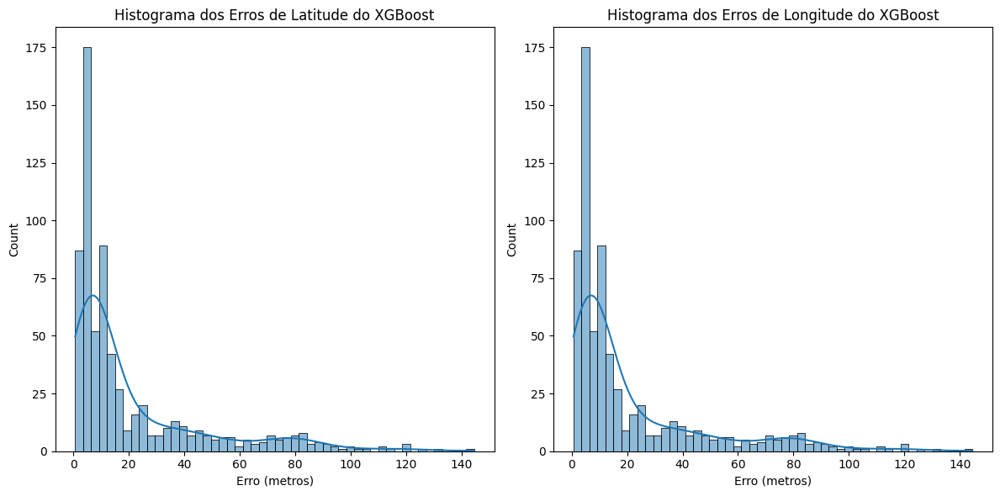

In [105]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.histplot(errors_lat_xgb, bins=50, kde=True)
plt.title('Histograma dos Erros de Latitude do XGBoost')
plt.xlabel('Erro (metros)')

plt.subplot(1, 2, 2)
sns.histplot(errors_lon_xgb, bins=50, kde=True)
plt.title('Histograma dos Erros de Longitude do XGBoost')
plt.xlabel('Erro (metros)')

plt.tight_layout()
plt.show()

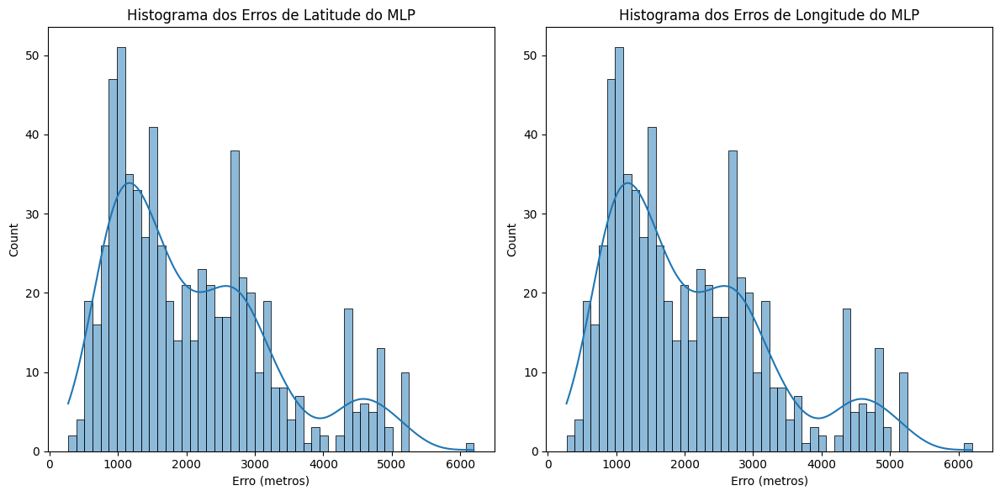

In [106]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.histplot(errors_lat_mlp, bins=50, kde=True)
plt.title('Histograma dos Erros de Latitude do MLP')
plt.xlabel('Erro (metros)')

plt.subplot(1, 2, 2)
sns.histplot(errors_lon_mlp, bins=50, kde=True)
plt.title('Histograma dos Erros de Longitude do MLP')
plt.xlabel('Erro (metros)')

plt.tight_layout()
plt.show()

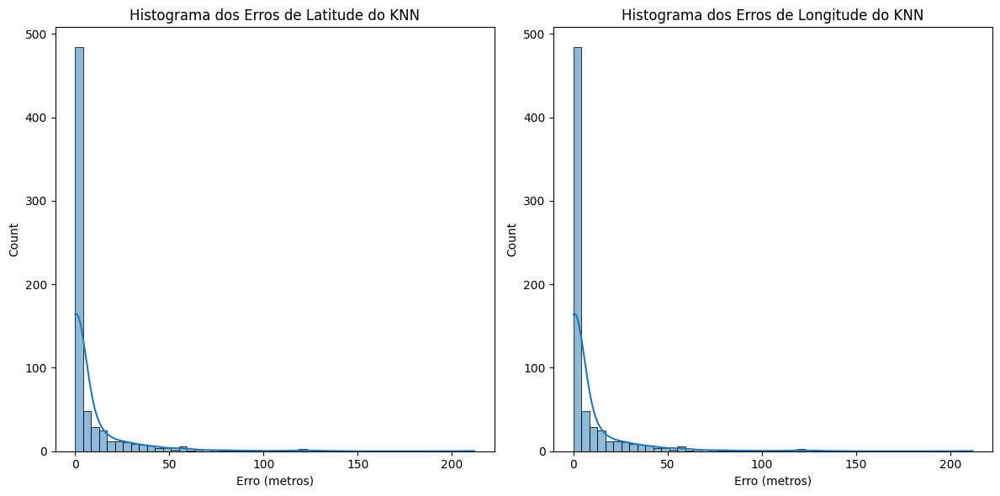

In [107]:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.histplot(errors_lat_knn, bins=50, kde=True)
plt.title('Histograma dos Erros de Latitude do KNN')
plt.xlabel('Erro (metros)')

plt.subplot(1, 2, 2)
sns.histplot(errors_lon_knn, bins=50, kde=True)
plt.title('Histograma dos Erros de Longitude do KNN')
plt.xlabel('Erro (metros)')

plt.tight_layout()
plt.show()

## Box-plot dos erros

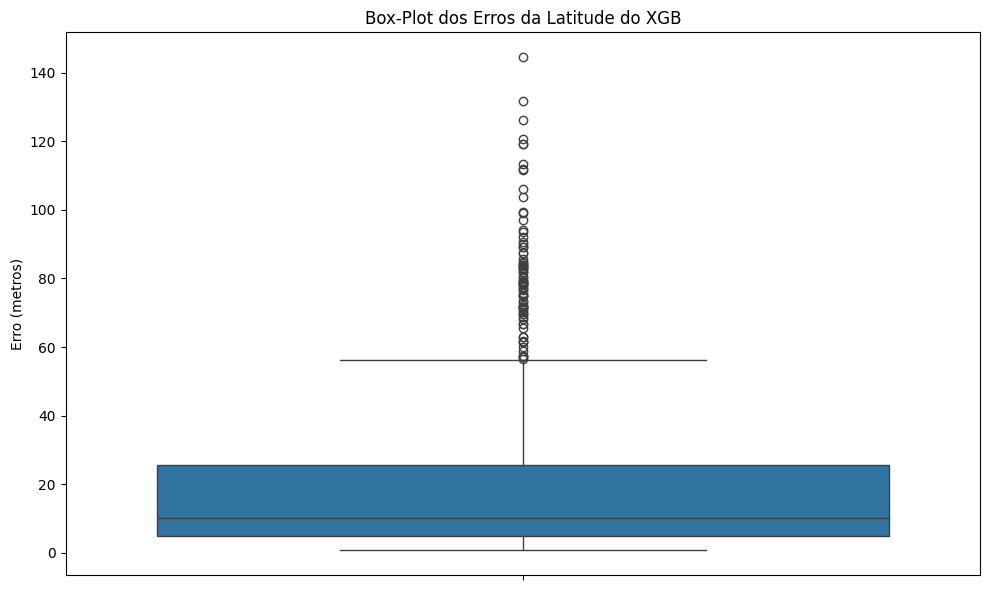

In [108]:
plt.figure(figsize=(10, 6))
sns.boxplot(y=errors_lat_xgb)
plt.title('Box-Plot dos Erros da Latitude do XGB')
plt.ylabel('Erro (metros)')

plt.tight_layout()
plt.show()

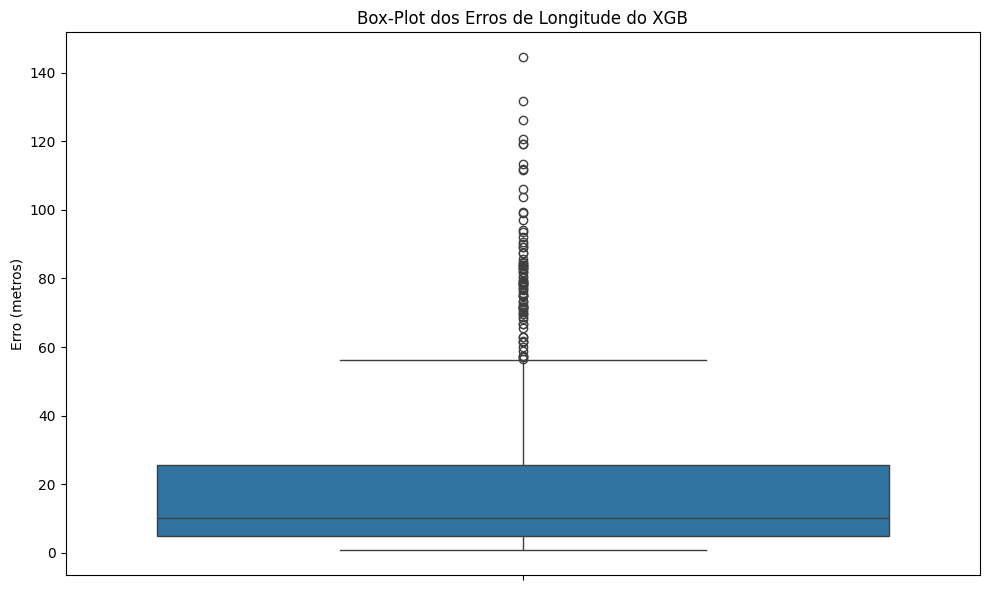

In [109]:
plt.figure(figsize=(10, 6))
sns.boxplot(y=errors_lon_xgb)
plt.title('Box-Plot dos Erros de Longitude do XGB')
plt.ylabel('Erro (metros)')

plt.tight_layout()
plt.show()

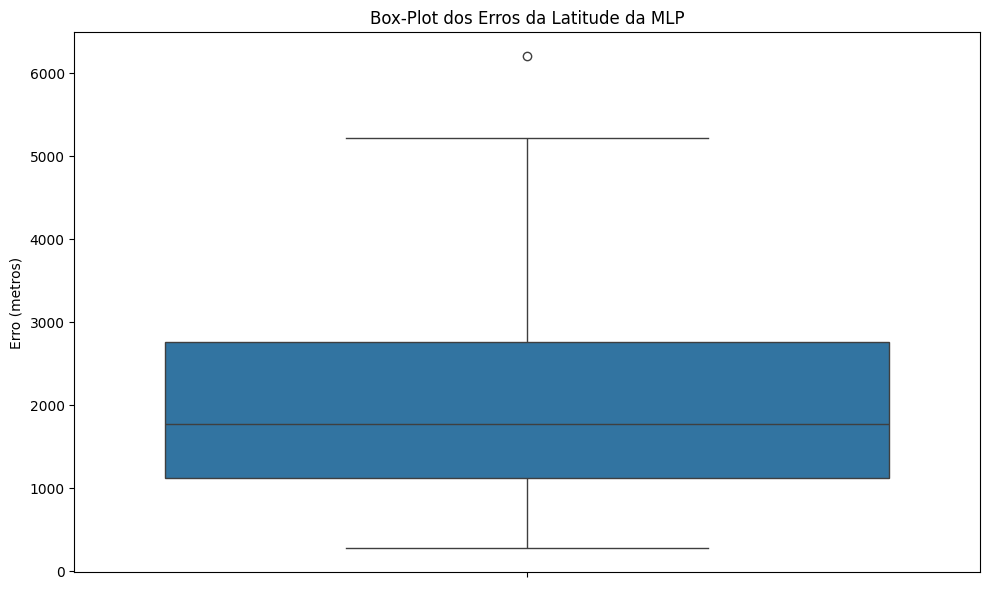

In [110]:
plt.figure(figsize=(10, 6))
sns.boxplot(y=errors_lat_mlp)
plt.title('Box-Plot dos Erros da Latitude da MLP')
plt.ylabel('Erro (metros)')

plt.tight_layout()
plt.show()

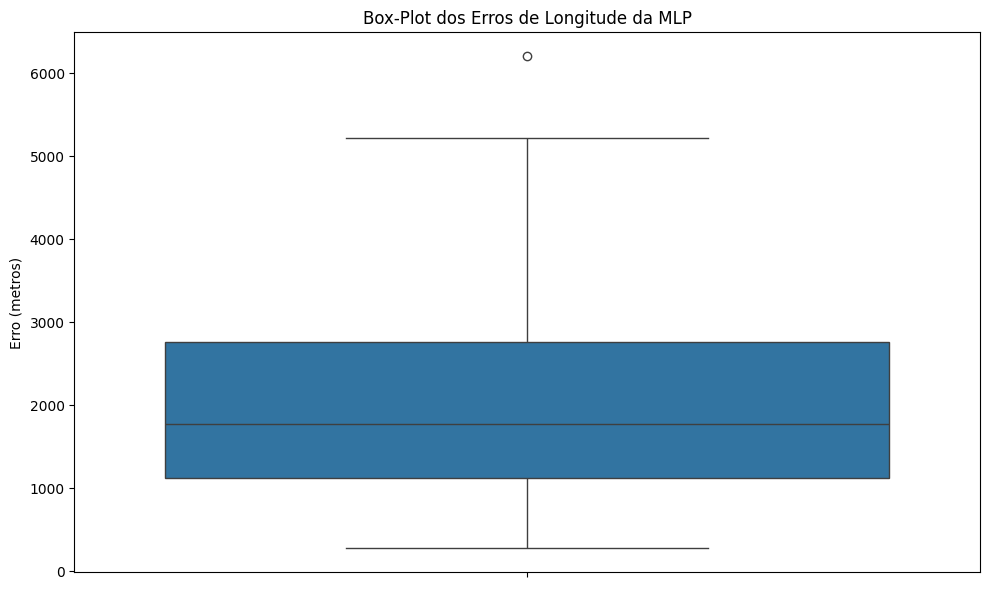

In [111]:
plt.figure(figsize=(10, 6))
sns.boxplot(y=errors_lon_mlp)
plt.title('Box-Plot dos Erros de Longitude da MLP')
plt.ylabel('Erro (metros)')

plt.tight_layout()
plt.show()

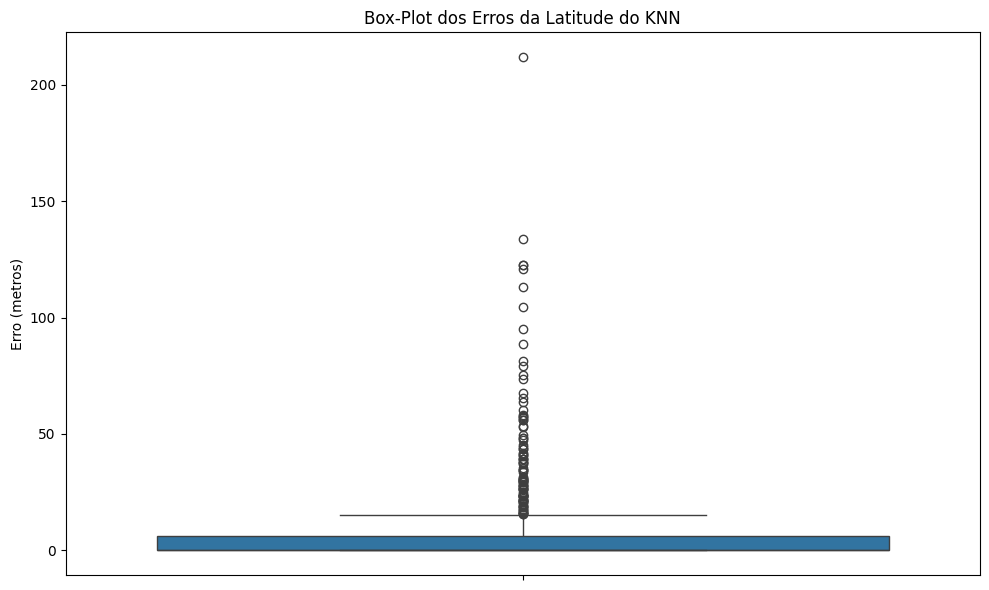

In [112]:
plt.figure(figsize=(10, 6))
sns.boxplot(y=errors_lat_knn)
plt.title('Box-Plot dos Erros da Latitude do KNN')
plt.ylabel('Erro (metros)')

plt.tight_layout()
plt.show()


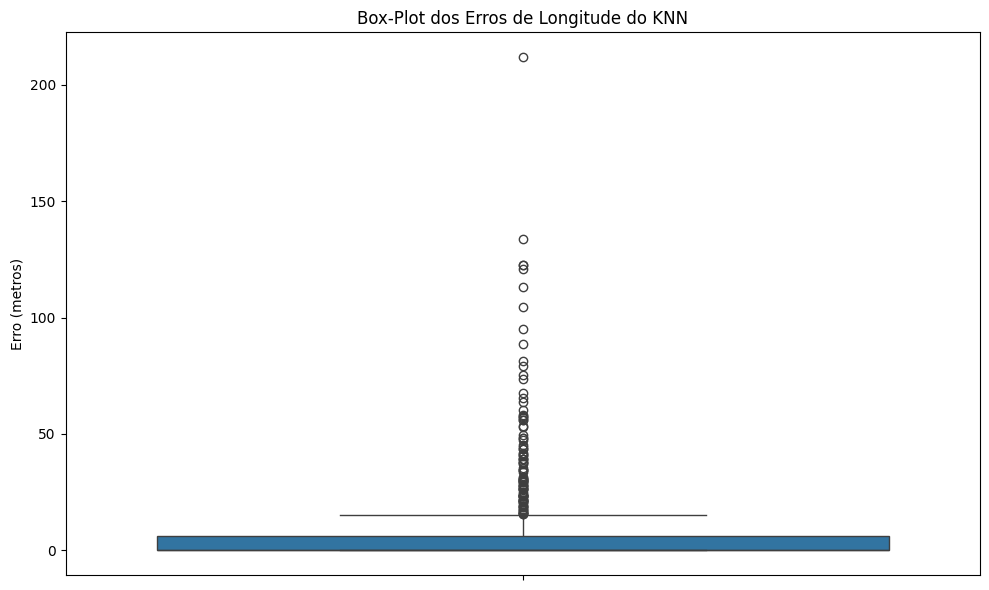

In [113]:
plt.figure(figsize=(10, 6))
sns.boxplot(y=errors_lon_knn)
plt.title('Box-Plot dos Erros de Longitude do KNN')
plt.ylabel('Erro (metros)')

plt.tight_layout()
plt.show()

## Estatísticas de erro (Erro Médio, Mínimo, Máximo e Desvio-Padrão)



Estatísticas de erro: latitude

In [114]:
errors = np.array(errors_lat_xgb)

mean_error = np.mean(errors)
min_error = np.min(errors)
max_error = np.max(errors)
std_error = np.std(errors)

print('XGBoost Latitude')
print(f"Erro Médio: {mean_error:.2f} metros")
print(f"Erro Mínimo: {min_error:.2f} metros")
print(f"Erro Máximo: {max_error:.2f} metros")
print(f"Desvio-Padrão: {std_error:.2f} metros")


errors = np.array(errors_lat_mlp)

mean_error = np.mean(errors)
min_error = np.min(errors)
max_error = np.max(errors)
std_error = np.std(errors)

print('MLP Latitude')
print(f"Erro Médio: {mean_error:.2f} metros")
print(f"Erro Mínimo: {min_error:.2f} metros")
print(f"Erro Máximo: {max_error:.2f} metros")
print(f"Desvio-Padrão: {std_error:.2f} metros")

errors = np.array(errors_lat_knn)

mean_error = np.mean(errors)
min_error = np.min(errors)
max_error = np.max(errors)
std_error = np.std(errors)

print('KNN Latitude')
print(f"Erro Médio: {mean_error:.2f} metros")
print(f"Erro Mínimo: {min_error:.2f} metros")
print(f"Erro Máximo: {max_error:.2f} metros")
print(f"Desvio-Padrão: {std_error:.2f} metros")

XGBoost Latitude
Erro Médio: 20.95 metros
Erro Mínimo: 0.65 metros
Erro Máximo: 144.58 metros
Desvio-Padrão: 25.81 metros
MLP Latitude
Erro Médio: 2084.66 metros
Erro Mínimo: 274.62 metros
Erro Máximo: 6197.35 metros
Desvio-Padrão: 1173.14 metros
KNN Latitude
Erro Médio: 7.71 metros
Erro Mínimo: 0.00 metros
Erro Máximo: 211.82 metros
Desvio-Padrão: 19.26 metros


Estatísticas de erro: longitude

In [115]:
errors = np.array(errors_lon_xgb)

mean_error = np.mean(errors)
min_error = np.min(errors)
max_error = np.max(errors)
std_error = np.std(errors)

print(f'XGBoost')
print(f"Erro Médio: {mean_error:.2f} metros")
print(f"Erro Mínimo: {min_error:.2f} metros")
print(f"Erro Máximo: {max_error:.2f} metros")
print(f"Desvio-Padrão: {std_error:.2f} metros")

errors = np.array(errors_lon_mlp)

mean_error = np.mean(errors)
min_error = np.min(errors)
max_error = np.max(errors)
std_error = np.std(errors)

print(f'MLP')
print(f"Erro Médio: {mean_error:.2f} metros")
print(f"Erro Mínimo: {min_error:.2f} metros")
print(f"Erro Máximo: {max_error:.2f} metros")
print(f"Desvio-Padrão: {std_error:.2f} metros")

errors = np.array(errors_lon_knn)

mean_error = np.mean(errors)
min_error = np.min(errors)
max_error = np.max(errors)
std_error = np.std(errors)

print(f'KNN')
print(f"Erro Médio: {mean_error:.2f} metros")
print(f"Erro Mínimo: {min_error:.2f} metros")
print(f"Erro Máximo: {max_error:.2f} metros")
print(f"Desvio-Padrão: {std_error:.2f} metros")


XGBoost
Erro Médio: 20.95 metros
Erro Mínimo: 0.65 metros
Erro Máximo: 144.58 metros
Desvio-Padrão: 25.81 metros
MLP
Erro Médio: 2084.66 metros
Erro Mínimo: 274.62 metros
Erro Máximo: 6197.35 metros
Desvio-Padrão: 1173.14 metros
KNN
Erro Médio: 7.71 metros
Erro Mínimo: 0.00 metros
Erro Máximo: 211.82 metros
Desvio-Padrão: 19.26 metros


## Porcentagem de erro dependendo de um threshold em metros


### MLP

In [116]:
error_threshold = 10 # em metros

errors_df_sorted = calculate_errors(X_test,Y_test[:, 0], Y_test[:, 1], Y_pred_final_mlp[:, 0], Y_pred_final_mlp[:, 1])
accuracy_percentage, incorrect_percentage = calculate_accuracy(errors_df_sorted, error_threshold)

print(f"Porcentagem de Pontos Corretos (Erro <= {error_threshold} metros): {accuracy_percentage:.2f}%")
print(f"Porcentagem de Pontos Incorretos (Erro > {error_threshold} metros): {incorrect_percentage:.2f}%")

Porcentagem de Pontos Corretos (Erro <= 10 metros): 0.00%
Porcentagem de Pontos Incorretos (Erro > 10 metros): 100.00%


In [117]:
errors_df_sorted = calculate_errors(X_test, Y_test[:, 0], Y_test[:, 1], Y_pred_final_mlp[:, 0], Y_pred_final_mlp[:, 1])
print(f'Acurácia em metros para o MLP: {accuracy_meters(errors_df_sorted):0.2f}')

Acurácia em metros para o MLP: 2084.66


### KNN

In [118]:
error_threshold = 10 # em metros

errors_df_sorted = calculate_errors(X_test, Y_test[:, 0], Y_test[:, 1], Y_pred_final_knn[:, 0], Y_pred_final_knn[:, 1])
accuracy_percentage, incorrect_percentage = calculate_accuracy(errors_df_sorted, error_threshold)

print(f"Porcentagem de Pontos Corretos (Erro <= {error_threshold} metros): {accuracy_percentage:.2f}%")
print(f"Porcentagem de Pontos Incorretos (Erro > {error_threshold} metros): {incorrect_percentage:.2f}%")

Porcentagem de Pontos Corretos (Erro <= 10 metros): 79.94%
Porcentagem de Pontos Incorretos (Erro > 10 metros): 20.06%


In [119]:
errors_df_sorted = calculate_errors(X_test, Y_test[:, 0], Y_test[:, 1], Y_pred_final_knn[:, 0], Y_pred_final_knn[:, 1])
print(f'Acurácia em metros para o KNN: {accuracy_meters(errors_df_sorted):0.2f}')

Acurácia em metros para o KNN: 7.71


### XGB

In [120]:
error_threshold = 10 # em metros

errors_df_sorted = calculate_errors(X_test, Y_test[:, 0], Y_test[:, 1], Y_pred_final_xgb[:, 0], Y_pred_final_xgb[:, 1])
accuracy_percentage, incorrect_percentage = calculate_accuracy(errors_df_sorted, error_threshold)

print(f"Porcentagem de Pontos Corretos (Erro <= {error_threshold} metros): {accuracy_percentage:.2f}%")
print(f"Porcentagem de Pontos Incorretos (Erro > {error_threshold} metros): {incorrect_percentage:.2f}%")

Porcentagem de Pontos Corretos (Erro <= 10 metros): 50.00%
Porcentagem de Pontos Incorretos (Erro > 10 metros): 50.00%


In [121]:
errors_df_sorted = calculate_errors(X_test, Y_test[:, 0], Y_test[:, 1], Y_pred_final_xgb[:, 0], Y_pred_final_xgb[:, 1])
print(f'Acurácia em metros para o XGB: {accuracy_meters(errors_df_sorted):0.2f}')

Acurácia em metros para o XGB: 20.95


## Mapa de visualização do ponto com maior erro em metros

### XGBoost

In [ ]:
# Valores reais vs previstos
index_to_test = int(errors_df_sorted.iloc[0]['Index'])

true_lat = Y_test[:, 0][index_to_test]
true_lon = Y_test[:, 1][index_to_test]
pred_lat = mlp_lat_final_xgb.predict([X_test[index_to_test]])[0]
pred_lon = mlp_lon_final_xgb.predict([X_test[index_to_test]])[0]
error = errors_df_sorted['Error'].min()

print(f"""
Latitude Real: {true_lat}
Longitude Real: {true_lon}
Latitude Predita: {pred_lat}
Longitude Predita: {pred_lon}
Erro (metros): {error}
""")


Latitude Real: 1.4877447076766857
Longitude Real: -3.34950412406927
Latitude Predita: 1.7494290130104115
Longitude Predita: -2.971164566856434
Erro (metros): 73832.62386537928



In [ ]:
# Criar o mapa centralizado no ponto com maior erro

y_test_lat_original = scaler_y_lat.inverse_transform(y_test_lat.reshape(-1, 1)).ravel()
y_test_lon_original = scaler_y_lon.inverse_transform(y_test_lon.reshape(-1, 1)).ravel()
y_pred_lat_final_original = scaler_y_lat.inverse_transform(y_pred_lat_final.reshape(-1, 1)).ravel()
y_pred_lon_final_original = scaler_y_lon.inverse_transform(y_pred_lon_final.reshape(-1, 1)).ravel()

true_lat = y_test_lat_original[0]
true_lon = y_test_lon_original[0]
pred_lat = y_pred_lat_final_original[0]
pred_lon = y_pred_lon_final_original[0]

map_center = [true_lat, true_lon]
map = folium.Map(location=map_center, zoom_start=50)

folium.Marker(
    location=[true_lat, true_lon],
    popup='Latitude Real: {:.6f}\nLongitude Real: {:.6f}'.format(true_lat, true_lon),
    icon=folium.Icon(color='blue', icon='info-sign')
).add_to(map)

folium.Marker(
    location=[pred_lat, pred_lon],
    popup='Latitude Predita: {:.6f}\nLongitude Predita: {:.6f}'.format(pred_lat, pred_lon),
    icon=folium.Icon(color='red', icon='info-sign')
).add_to(map)

folium.PolyLine(
    locations=[[true_lat, true_lon], [pred_lat, pred_lon]],
    color='green',
    weight=2.5,
    opacity=0.7
).add_to(map)

map

## Mapa de comparação: posições preditas vs. posições reais



In [ ]:
mapa = folium.Map(location=[np.mean(y_test_lat_original), np.mean(y_test_lon_original)], zoom_start=12)

# Adicionar marcadores para os pontos reais (azul)
for lat, lon in zip(y_test_lat_original, y_test_lon_original):
    folium.CircleMarker(location=[lat, lon], radius=5, color='blue', fill=True, fill_color='blue', fill_opacity=0.6).add_to(mapa)

# Adicionar marcadores para os pontos previstos (vermelho)
for lat, lon in zip(y_pred_lat_final_original, y_pred_lon_final_original):
    folium.CircleMarker(location=[lat, lon], radius=5, color='red', fill=True, fill_color='red', fill_opacity=0.6).add_to(mapa)

# Exibir o mapa
mapa